# NEON Paper Plots (Bias plots) 
## Fig 5: Spatial statitics (bias & RMSE)

#### Author : Negin Sobhani negins@ucar.edu [@negin513](https://github.com/negin513)

#### Last revised: 2022-10-11
______________

This notebook has the scripts for creating spatial Statitics plots. 

**First, you should run neon_preprocessor** to preprocess all neon simulation and evaluation files to csv. (just to make things faster! ) 


This notebooks have the scripts for:

1. Creating Bias and RMSE spatial maps for all variables and each season. 
2. Make CTSM mean, NEON mean, Bias, and RMSE spatial maps for each variable and each season. 


In [ ]:
import os
import time
import datetime

import numpy as np
import pandas as pd

from glob import glob
from os.path import join

import matplotlib
import matplotlib.pyplot as plt

import tqdm

import cartopy
import cartopy.crs as crs
import cartopy.feature as cfeature
from matplotlib.cm import get_cmap
from cartopy import crs as ccrs, feature as cfeature


import warnings
warnings.filterwarnings('ignore')

## Useful Functions and Objects:

In [2]:
# -- Functions for calculating stats
# Mean Absolute Error
def mae(predict, actual):
    """
    Examples(rounded for precision):
    >>> actual = [1,2,3];predict = [1,4,3]
    >>> np.around(mae(predict,actual),decimals = 2)
    0.67

    >>> actual = [1,1,1];predict = [1,1,1]
    >>> mae(predict,actual)
    0.0
    """
    predict = np.array(predict)
    actual = np.array(actual)
    d = {'predict':predict,'actual':actual}
    df = pd.DataFrame (d, columns =['predict','actual'])
    df= df.dropna()
    
    difference = abs(df['predict'] - df['actual'])
    score = difference.mean()

    return score


# Mean Squared Error
def mse(predict, actual):
    """
    Examples(rounded for precision):
    >>> actual = [1,2,3];predict = [1,4,3]
    >>> np.around(mse(predict,actual),decimals = 2)
    1.33

    >>> actual = [1,1,1];predict = [1,1,1]
    >>> mse(predict,actual)
    0.0
    """
    predict = np.array(predict)
    actual = np.array(actual)

    difference = predict - actual
    square_diff = np.square(difference)

    score = square_diff.mean()
    return score


# Mean Bias Deviation
def mbd(predict, actual):
    """
    This value is Negative, if the model underpredicts,
    positive, if it overpredicts.

    Example(rounded for precision):

    Here the model overpredicts
    >>> actual = [1,2,3];predict = [2,3,4]
    >>> np.around(mbd(predict,actual),decimals = 2)
    50.0

    Here the model underpredicts
    >>> actual = [1,2,3];predict = [0,1,1]
    >>> np.around(mbd(predict,actual),decimals = 2)
    -66.67
    """
    predict = np.array(predict)
    actual = np.array(actual)

    d = {'predict':predict,'actual':actual}
    df = pd.DataFrame (d, columns =['predict','actual'])
    df= df.dropna()
    
    
    difference = df['predict'] - df['actual']
    numerator = np.sum(difference) / len(df['predict'])
    denumerator = np.sum(df['actual']) / len(df['predict'])
    # print(numerator, denumerator)
    score = float(numerator) / denumerator * 100

    return score


def manual_accuracy(predict, actual):
    return np.mean(np.array(actual) == np.array(predict))

def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())


# Root Mean Square Logarithmic Error
def rmsle(predict, actual):
    """
    Examples(rounded for precision):
    >>> actual = [10,10,30];predict = [10,2,30]
    >>> np.around(rmsle(predict,actual),decimals = 2)
    0.75

    >>> actual = [1,1,1];predict = [1,1,1]
    >>> rmsle(predict,actual)
    0.0
    """
    predict = np.array(predict)
    actual = np.array(actual)

    log_predict = np.log(predict + 1)
    log_actual = np.log(actual + 1)

    difference = log_predict - log_actual
    square_diff = np.square(difference)
    mean_square_diff = square_diff.mean()

    score = np.sqrt(mean_square_diff)

    return score

def MBE(y_true, y_pred):
    '''
    Parameters:
        y_true (array): Array of observed values
        y_pred (array): Array of prediction values

    Returns:
        mbe (float): Bias
    '''
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_true = y_true.reshape(len(y_true),1)
    y_pred = y_pred.reshape(len(y_pred),1)   
    diff = (y_pred-y_true)
    mbe = np.nanmean(diff)
    #print('MBE = ', mbe)
    return mbe

In [3]:
def plot_site_maps(df, plot_var, title, ax, vmin, vmax, cmap = "viridis"):

    ax.add_feature(cartopy.feature.OCEAN)
    ax.add_feature(cartopy.feature.LAKES, edgecolor='dimgray')

    #ax.add_feature(cartopy.feature.LAND, edgecolor='black')
    ax.add_feature(cartopy.feature.LAND)

    ax.add_feature(cfeature.BORDERS, linewidth=0.9, edgecolor='dimgray')
    ax.add_feature(cfeature.STATES, linewidth=0.5, edgecolor='dimgray')
    ax.add_feature(cfeature.COASTLINE)
    
    ax.set_extent([lonW, lonE, latS, latN], crs=projPC)

    
    # -- This plots all sites (for missing sites)
    plt.scatter(x=df.Lon, y=df.Lat,
                color='gray',
                s=80,
                alpha=1,
                transform=crs.PlateCarree()) ## Important

    sc = plt.scatter(x=df.Lon, y=df.Lat,
                c=df[plot_var],
                s=80,
                alpha=1,
                transform=crs.PlateCarree(), cmap=get_cmap(cmap), vmin = vmin, vmax= vmax, edgecolor='black', linewidth = 0.8) ## Important

    gl = ax.gridlines(
        draw_labels=False, linewidth=0.1, color='gray', alpha=0.5, linestyle='--'
    )
    
    gl.top_labels=False
    gl.right_labels=False

    gl.xlabel_style = { 'weight': 'bold', 'size':11}
    gl.ylabel_style = { 'weight': 'bold', 'size':11}

    ax.set_extent(extent)

    #cax = fig.add_axes([ax.get_position().x1+0.031,ax.get_position().y0,0.031,ax.get_position().height])
    cax = fig.add_axes([ax.get_position().x1+0.021,ax.get_position().y0,0.013,ax.get_position().height])
    #print ([ax.get_position().x1+0.021,ax.get_position().y0,0.021001,ax.get_position().height])
    cbar = plt.colorbar(sc, extend='both',cax=cax)
    #ax.stock_img()
    cbar.ax.tick_params(labelsize=12)

    #cbar.set_label('Mean TMin Bias (C)')
    #title = plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season + stat_var
    ax.set_title(title, fontsize=16, fontweight='bold')

In [5]:
class PlotVariable ():
  def __init__(self, short_name, long_name, unit):
    self.short_name = short_name
    self.long_name = long_name
    self.unit = unit
    self.obs_var = short_name
    self.sim_var = 'sim_'+short_name


In [4]:
def get_bias_data (df, var, season):
    '''
    get bias and other stats for a variable over a season or annual average
    '''
    
    if (season != "Annual"):
        df_this = df[df['season']==season]
    else:
        df_this = df
    
    sim_var_name = "sim_"+var

    if var == 'NEE' or var == 'GPP':
        min_thresh = -100 * (12.01/1000000) *60*60*24
        max_thresh = 100 * (12.01/1000000) *60*60*24
    elif var == 'Rnet' or var == 'FSH' or var == 'EFLX_LH_TOT':
        min_thresh = -500
        max_thresh = 1000

    if var == 'ELAI':
        df = df_this
    else:
        #df, count = remove_outliers_manual (df_this, var, min_thresh, max_thresh)
        df = df_this

    
    #neon_sites_2 = pd.read_csv('/glade/scratch/negins/preprocessed_neon_csv_data/neon_sites_dompft.csv')
    neon_sites_2 = pd.read_csv('/glade/scratch/wwieder/run_NEON_v2/tools/site_and_regional/neon_sites_dompft.csv')
    for i, row in neon_sites_2.iterrows():
        lat = row['Lat']
        lon = row['Lon']
        site = row['Site']
        
        
    cleaned = neon_sites_2[neon_sites_2['Site'].isin(neon_sites)].reset_index()
    
    mean_neon_var = 'mean_neon_'+var
    mean_clm_var = 'mean_clm_'+var
    bias_var = 'bias_'+var
    bias_score_var = 'bias_score_'+var
    rmse_var = 'rmse_'+var
    mae_var = 'mae_'+var
    mbd_var = 'mbd_'+var
    
    
    cleaned[mean_neon_var] = np.nan
    cleaned[mean_clm_var] = np.nan
    cleaned[bias_var] = np.nan
    cleaned[rmse_var] = np.nan
    cleaned[mae_var] = np.nan
    cleaned[mbd_var] = np.nan
    cleaned[bias_score_var] = np.nan
    
    
    for i, row in cleaned.iterrows():
        #print (row)
        neon_site = cleaned['Site'][i]
    
        df_this = df[df['site']==neon_site]
    
        sim_var = 'sim_'+var
        
        this_rmse = rmse(df_this[sim_var], df_this[var])
        cleaned[rmse_var][i]= this_rmse
        
        this_mae = mae(df_this[sim_var], df_this[var])
        cleaned[mae_var][i]= this_mae
        
        this_mbd = mbd(df_this[sim_var], df_this[var])
        cleaned[mbd_var][i]= this_mbd
        
        this_neon_mean = df_this[var].mean()
        this_clm_mean = df_this[sim_var].mean()
        
        #this_bias = this_clm_mean - this_neon_mean
        this_bias = MBE(df_this[var],df_this[sim_var])

        cleaned[mean_neon_var][i]= this_neon_mean
        cleaned[mean_clm_var][i]= this_clm_mean
        cleaned[bias_var][i]= this_bias

        this_bscore = (this_clm_mean - this_neon_mean)/this_rmse
        cleaned[bias_score_var][i]= this_bscore
        
    return cleaned

## Variables to create plots

Create a list of variables instances for the plots. 

In [6]:
all_vars= [] 

plot_var = 'FSH'
sim_var = 'sim_'+plot_var
plot_var_desc = 'Sensible Heat Flux'
plot_var_unit= "Wm⁻²"
this_var = PlotVariable(plot_var, plot_var_desc, plot_var_unit)
all_vars.append(this_var)

plot_var = 'EFLX_LH_TOT'
sim_var = 'sim_'+plot_var
plot_var_desc = "Latent Heat Flux"
plot_var_unit= "Wm⁻²"
this_var = PlotVariable(plot_var, plot_var_desc, plot_var_unit)
all_vars.append(this_var)


plot_var = 'GPP'
sim_var = 'sim_'+plot_var
plot_var_desc = "Gross Primary Production"
plot_var_unit= "gCm⁻²day⁻¹"
this_var = PlotVariable(plot_var, plot_var_desc, plot_var_unit)
all_vars.append(this_var)


plot_var = 'NEE'
sim_var = 'sim_'+plot_var
plot_var_desc = "Net Ecosystem Exchange"
plot_var_unit= "gCm⁻²day⁻¹"
this_var = PlotVariable(plot_var, plot_var_desc, plot_var_unit)
all_vars.append(this_var)

plot_var = 'Rnet'
sim_var = 'sim_'+plot_var
plot_var_desc = "Net Radiation"
plot_var_unit= "Wm⁻²"
this_var = PlotVariable(plot_var, plot_var_desc, plot_var_unit)
all_vars.append(this_var)

---------------------------

In [7]:
# -- read list of sites:
#neon_sites_pft = pd.read_csv('/glade/scratch/negins/preprocessed_neon_csv_data/neon_sites_dompft.csv')
neon_sites_pft = pd.read_csv('/glade/scratch/wwieder/run_NEON_v2/tools/site_and_regional/neon_sites_dompft.csv')
neon_sites = neon_sites_pft['Site'].to_list()

failed_sites = [] # -- list for saving failed sites

In [8]:
## -- Setting some defaults for our figures:
plt.rcParams["font.weight"] = "bold"    
plt.rcParams["axes.labelweight"] = "bold"
font = {'weight' : 'bold',
        'size'   : 15} 
matplotlib.rc('font', **font)

In [9]:
failed_sites = [] # -- list for saving failed sites
df_list =[]
start_site = time.time()

#csv_dir = "/glade/scratch/negins/preprocessed_neon_v2/"
csv_dir = "/glade/scratch/wwieder/preprocessed_neon_v2/"

for neon_site in tqdm.tqdm(neon_sites):
    try: 
        csv_file = "preprocessed_"+neon_site+"*.csv"
        for f in glob((os.path.join(csv_dir, csv_file))):
            this_df = pd.read_csv(f)
        df_list.append(this_df)
    except Exception as e: 
        print (e)
        print ('THIS SITE FAILED:', neon_site)
        failed_sites.append(neon_site)
        pass

df_all = pd.concat(df_list)
df_all['season'] = ((df_all['month']%12+3)//3).map({1:'DJF', 2: 'MAM', 3:'JJA', 4:'SON'})

end_site = time.time()
print("Reading all preprocessed files took:", end_site-start_site, "s.")

print ("Number of failed sites : ", len(failed_sites))
print (*failed_sites, sep=" \n")

100%|██████████| 47/47 [00:11<00:00,  4.12it/s]


Reading all preprocessed files took: 12.098602533340454 s.
Number of failed sites :  0



In [10]:
#out_dir = "/glade/work/negins/neon_vis_plots/paper_plots_final/"
out_dir = "/glade/work/wwieder/neon_vis_plots/paper_plots_final/"

if not os.path.exists (out_dir):
    print ("plot directory does not exist... creating it now!")
    os.makedirs(out_dir, exist_ok=True)            


## Bias maps for for all vars and every season + annualprojPC = ccrs.PlateCarree()


In [11]:
projPC = ccrs.PlateCarree()
lonW = -127
lonE = -67
latS = 20
latN = 55
cLat = (latN + latS) / 2
cLon = (lonW + lonE) / 2
res = '110m'

central_lon = cLat
central_lat = cLon

central_lat = 37.5
central_lon = -96

extent = [-120, -70, 24, 50.5]

Going Through the list of sites and make plots for all of them.
If you want to save your plots change `save_flag = True`. 

Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/png/spatial_bias_all_vars_Annual.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/pdf/spatial_bias_all_vars_Annual.pdf
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/png/spatial_bias_all_vars_DJF.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/pdf/spatial_bias_all_vars_DJF.pdf
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/png/spatial_bias_all_vars_MAM.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/pdf/spatial_bias_all_vars_MAM.pdf
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/png/spatial_bias_all_vars_JJA.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/pdf/spatial_bias_all_vars_JJA.pdf
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/bias_maps_allvars/png/spatial_bias_all

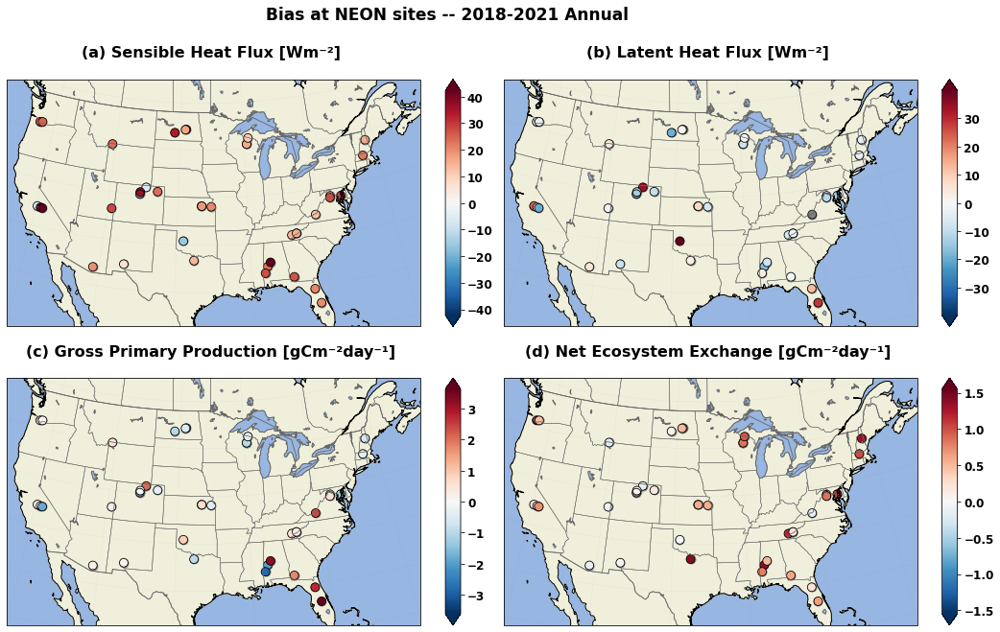

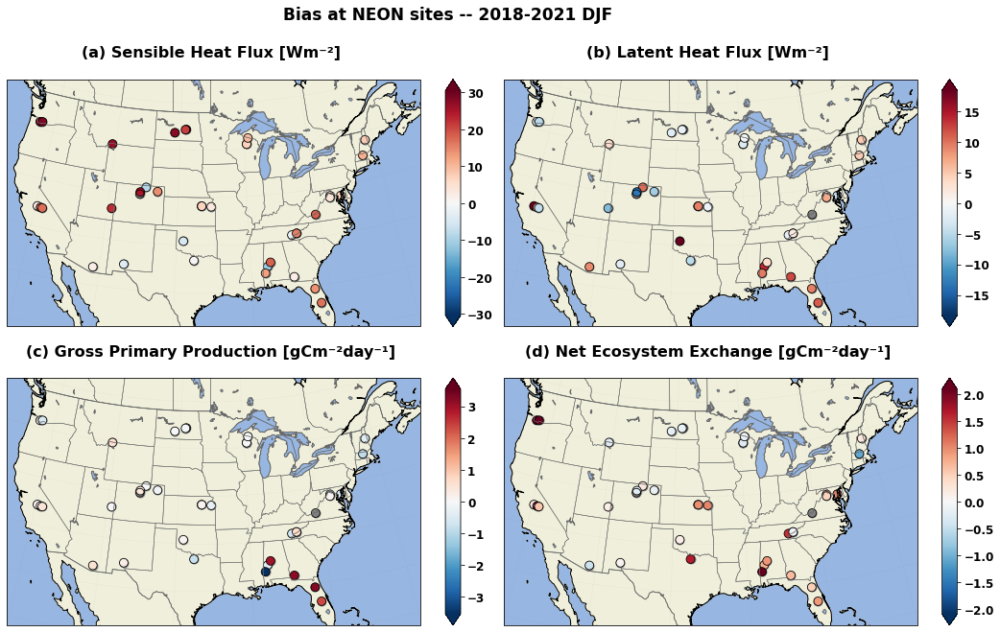

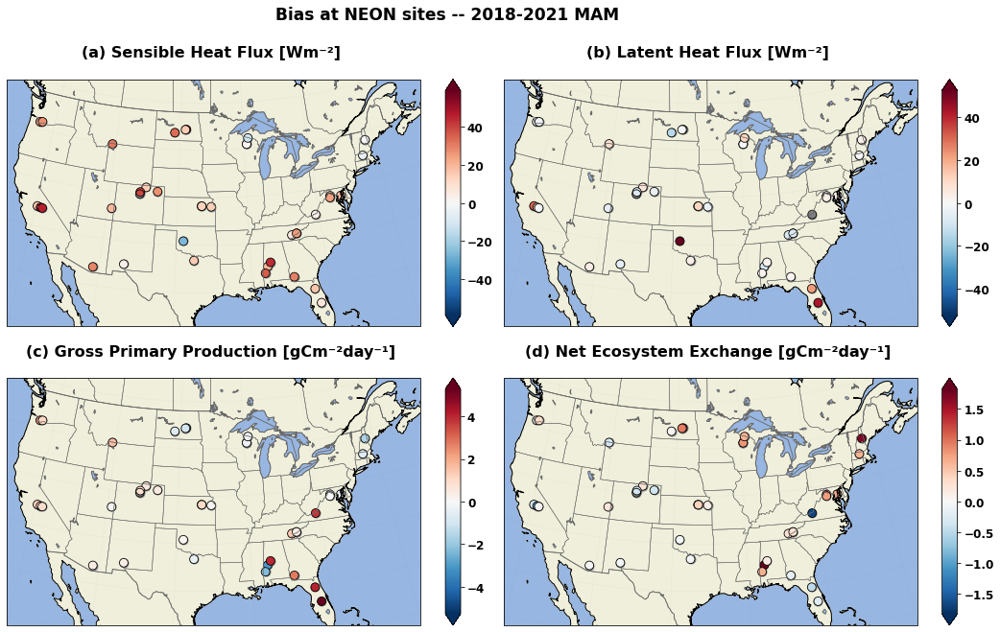

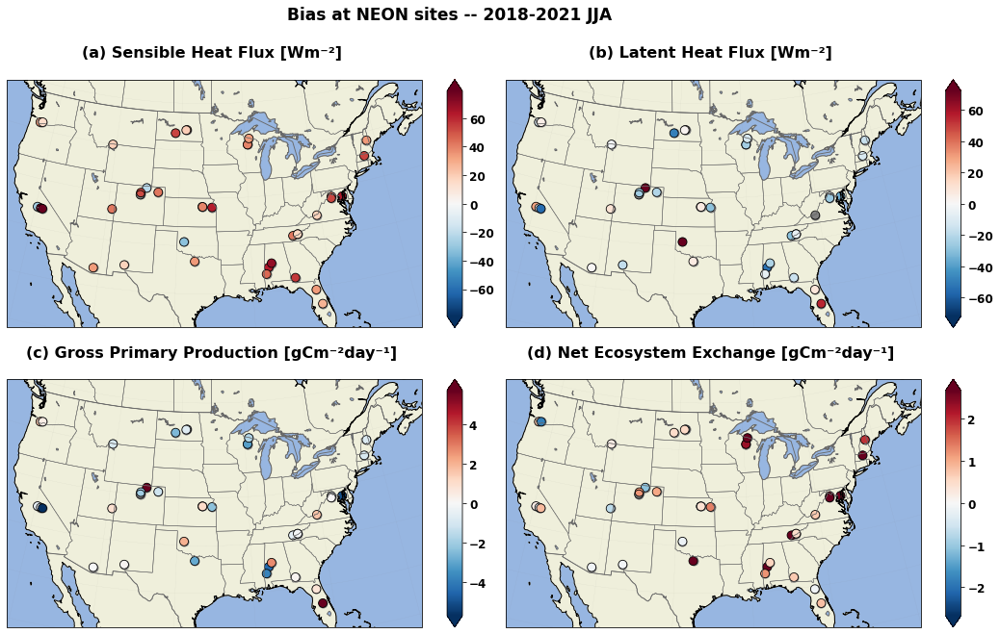

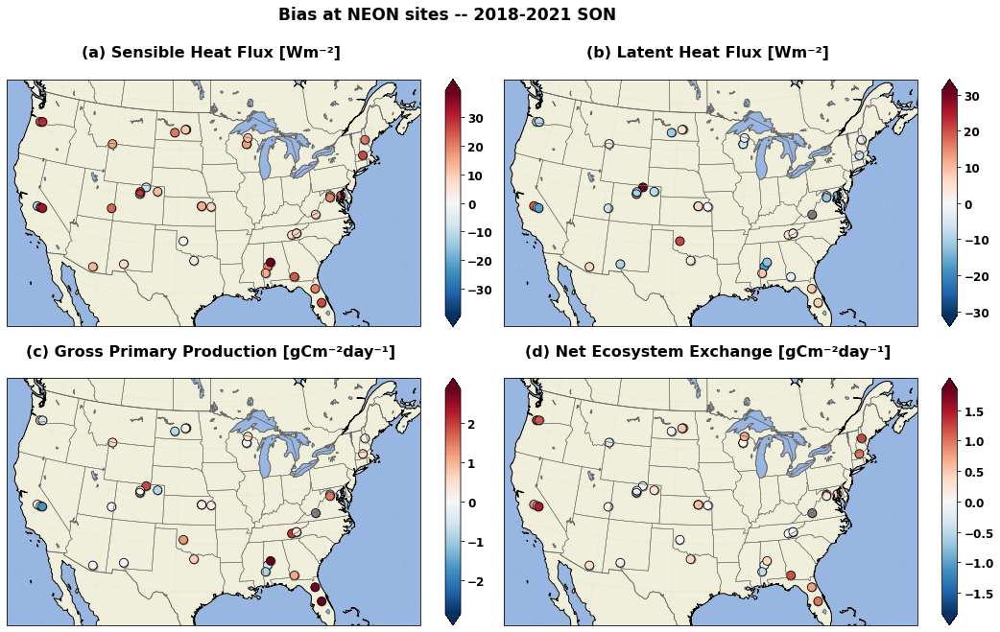

In [12]:
projection=ccrs.AlbersEqualArea(central_lon, central_lat)

seasons = ['Annual','DJF', 'MAM', 'JJA', 'SON']
save_flag = True
letters = ["(a)","(b)","(c)","(d)"]
for season in seasons:
    fig = plt.figure(figsize=(17,10.5), facecolor='w', edgecolor='k')
    
    for idx, var in enumerate( all_vars[:-1]):
        plot_var = var.obs_var
        sim_var = var.sim_var
        plot_var_desc = var.long_name
        plot_var_unit = var.unit        #var = 'FSH'

        df_tmp = get_bias_data(df_all, plot_var, season)
        this_var = 'bias_'+plot_var

        min_val = min(df_tmp[this_var])
        max_val = max(df_tmp[this_var])
        
        abs_val = max(abs(min_val), abs(max_val))
        
        vmin = -abs_val*0.9
        vmax = abs_val*0.9
        
        cmap = matplotlib.cm.get_cmap('RdBu_r')

        ax = fig.add_subplot(2,2,idx+1, projection=projection)

        #title = "Bias "+ plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season
        title = letters[idx]+" "+plot_var_desc+" ["+plot_var_unit+"]" + " \n"

        plot_site_maps(df_tmp, this_var, title, ax, vmin, vmax, cmap)
        
        
        
    plt.suptitle("Bias"+" at NEON sites"+" -- 2018-2021"+ " " + season, fontsize=17, fontweight='bold')
    #plt.subplots_adjust(wspace=0.2,hspace=0.2)
    
    if save_flag:
        #--- saving png plot
        plot_name = 'spatial_bias_all_vars'+'_'+season+'.png'
        plot_dir = os.path.join(out_dir,'bias_maps_allvars', 'png')
        if not os.path.isdir(plot_dir):
            os.makedirs(plot_dir, exist_ok=True)            
        
        print ('Saving '+ os.path.join(plot_dir,plot_name))
        plt.savefig (os.path.join(plot_dir,plot_name), dpi=600,bbox_inches='tight')
        
        #--- saving pdf plot
        plot_name = 'spatial_bias_all_vars'+'_'+season+'.pdf'
        plot_dir = os.path.join(out_dir,'bias_maps_allvars', 'pdf')
        if not os.path.isdir(plot_dir):
            os.makedirs(plot_dir, exist_ok=True)            
            
        print ('Saving '+ os.path.join(plot_dir,plot_name))
        plt.savefig (os.path.join(plot_dir,plot_name), dpi=600,bbox_inches='tight', format = 'pdf')  
    else:
        plt.show()
    


## RMSE maps for all vars and every season + annual

Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/rmse_maps_allvars/png/spatial_rmse_all_vars_Annual.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/rmse_maps_allvars/png/spatial_rmse_all_vars_DJF.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/rmse_maps_allvars/png/spatial_rmse_all_vars_MAM.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/rmse_maps_allvars/png/spatial_rmse_all_vars_JJA.png
Saving /glade/work/wwieder/neon_vis_plots/paper_plots_final/rmse_maps_allvars/png/spatial_rmse_all_vars_SON.png


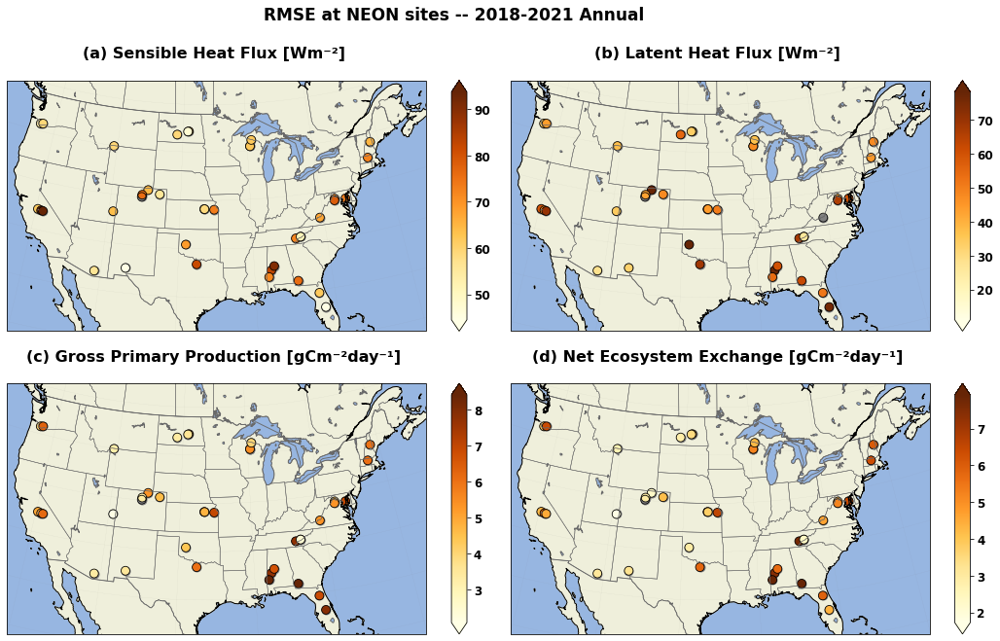

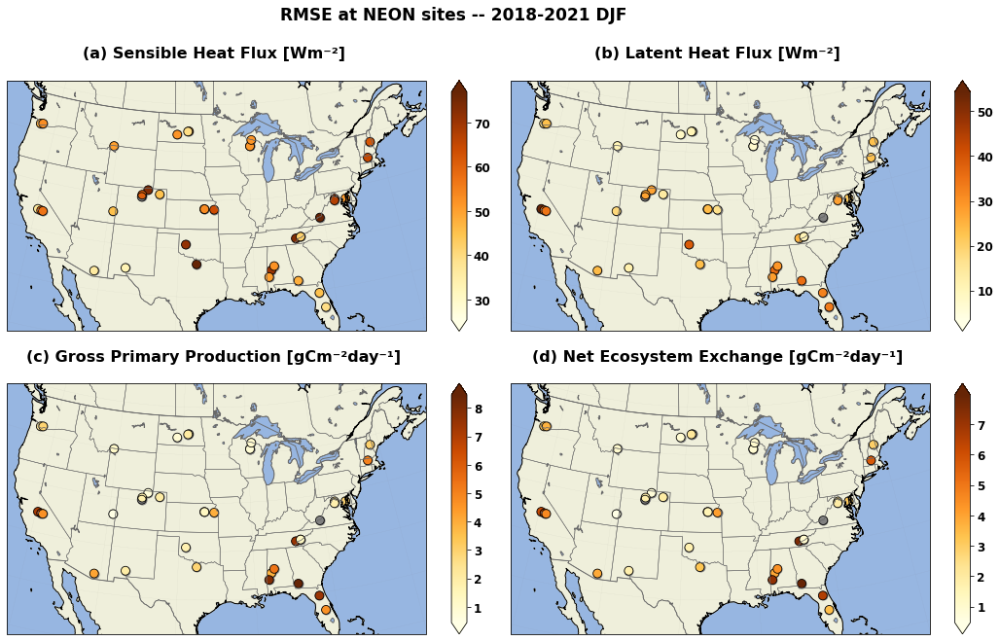

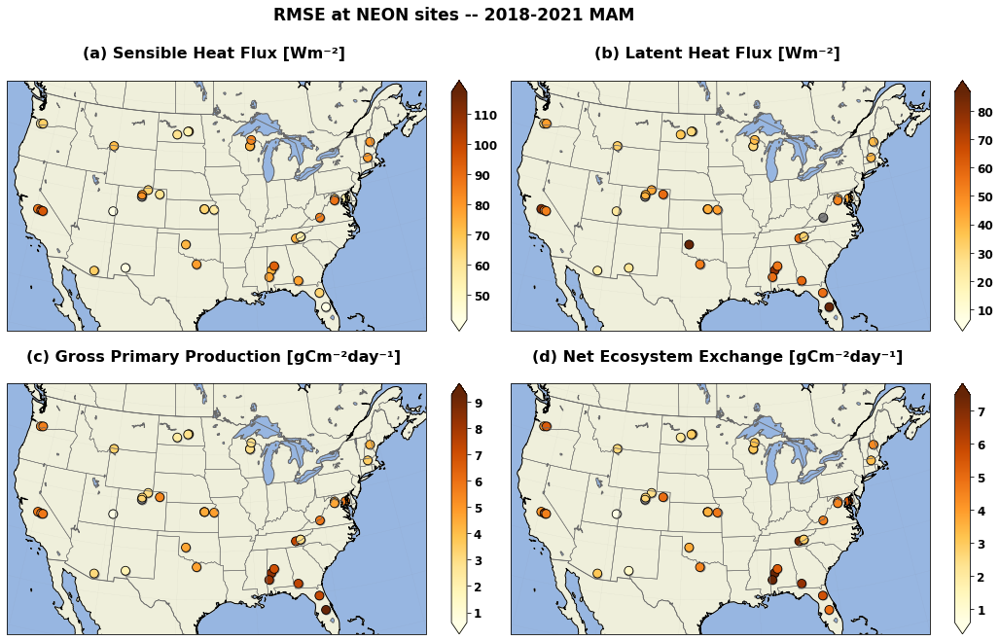

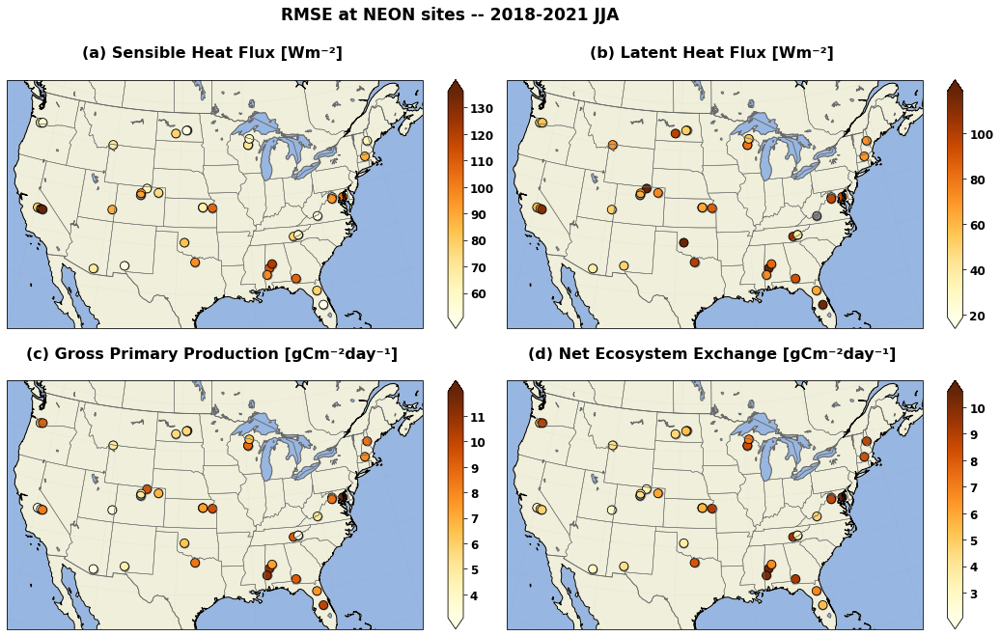

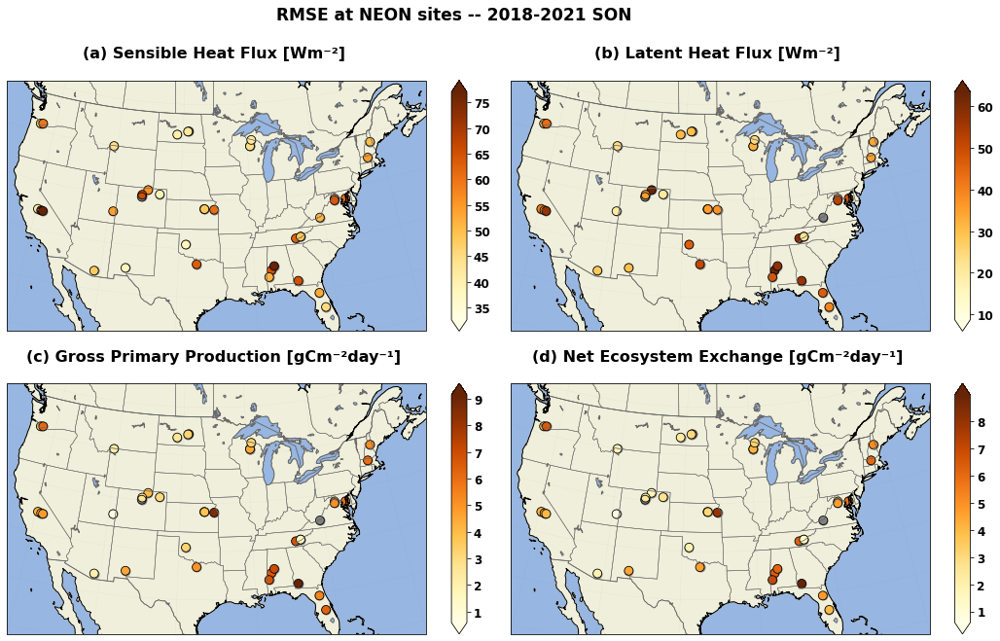

In [13]:
projection=ccrs.AlbersEqualArea(central_lon, central_lat)

seasons = ['Annual','DJF', 'MAM', 'JJA', 'SON']
save_flag = True

for season in seasons:
    fig = plt.figure(figsize=(17,10.5), facecolor='w', edgecolor='k')
    
    for idx, var in enumerate( all_vars[:-1]):
        plot_var = var.obs_var
        sim_var = var.sim_var
        plot_var_desc = var.long_name
        plot_var_unit = var.unit        #var = 'FSH'

        df_tmp = get_bias_data(df_all, plot_var, season)
        this_var = 'rmse_'+plot_var

        min_val = min(df_tmp[this_var])
        max_val = max(df_tmp[this_var])
        
        
        vmin = min_val+0.1*min_val
        vmax = max_val-0.1*max_val
        
        cmap = 'YlOrBr'
        #cmap = matplotlib.cm.get_cmap('viridis_r')

        ax = fig.add_subplot(2,2,idx+1, projection=projection)

        #title = "RMSE "+ plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season
        title = letters[idx]+" "+plot_var_desc+" ["+plot_var_unit+"]" + " \n"
        #title = plot_var_desc+" ["+plot_var_unit+"]" + " RMSE \n"

        plot_site_maps(df_tmp, this_var, title, ax, vmin, vmax, cmap)
        
        
    plt.suptitle("RMSE"+" at NEON sites"+" -- 2018-2021"+ " " + season, fontsize=17, fontweight='bold')
    
    #plt.subplots_adjust(wspace=0.2,hspace=0.2)
    if save_flag:
        plot_name = 'spatial_rmse_all_vars'+'_'+season+'.png'
        plot_dir = os.path.join(out_dir,'rmse_maps_allvars', 'png')
        if not os.path.isdir(plot_dir):
            os.makedirs(plot_dir, exist_ok=True)   

        print ('Saving '+ os.path.join(plot_dir,plot_name))
        plt.savefig (os.path.join(plot_dir,plot_name), dpi=600,bbox_inches='tight')     
    else:
        plt.show()
    


# Mean CLM, Mean NEON, BIAS , and RMSE maps for each variable (seperately) and each season

FSH


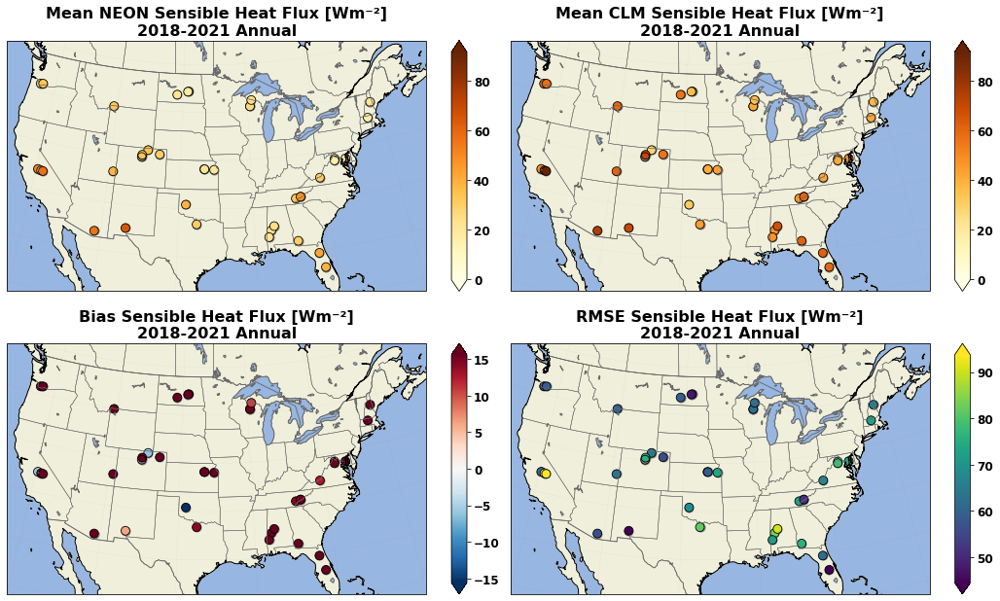

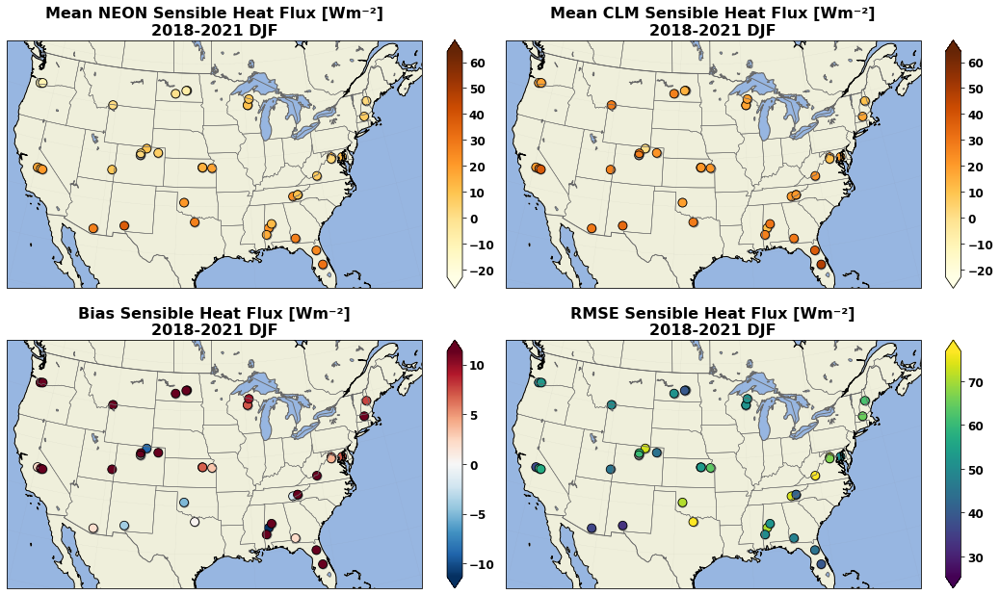

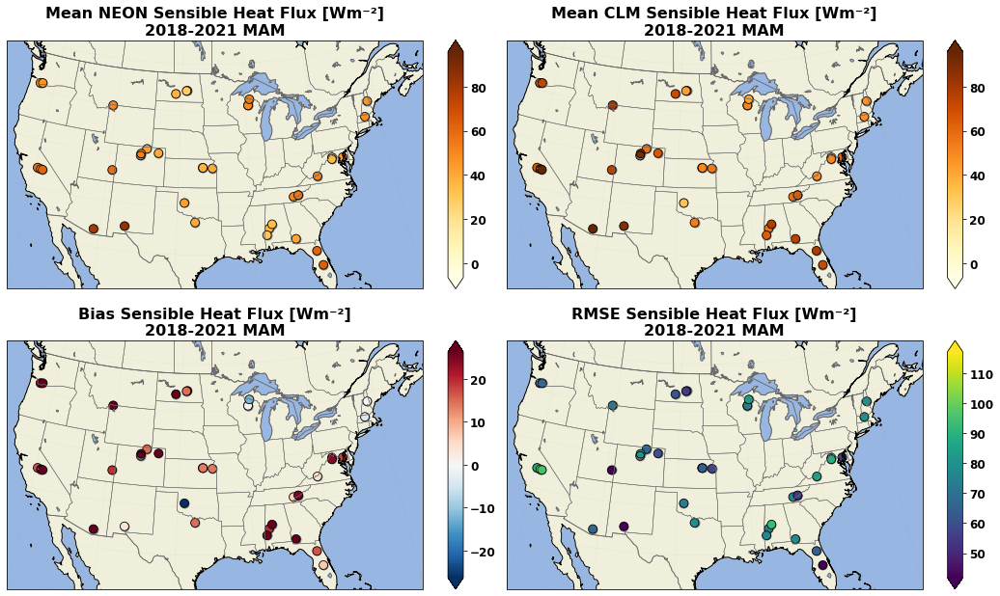

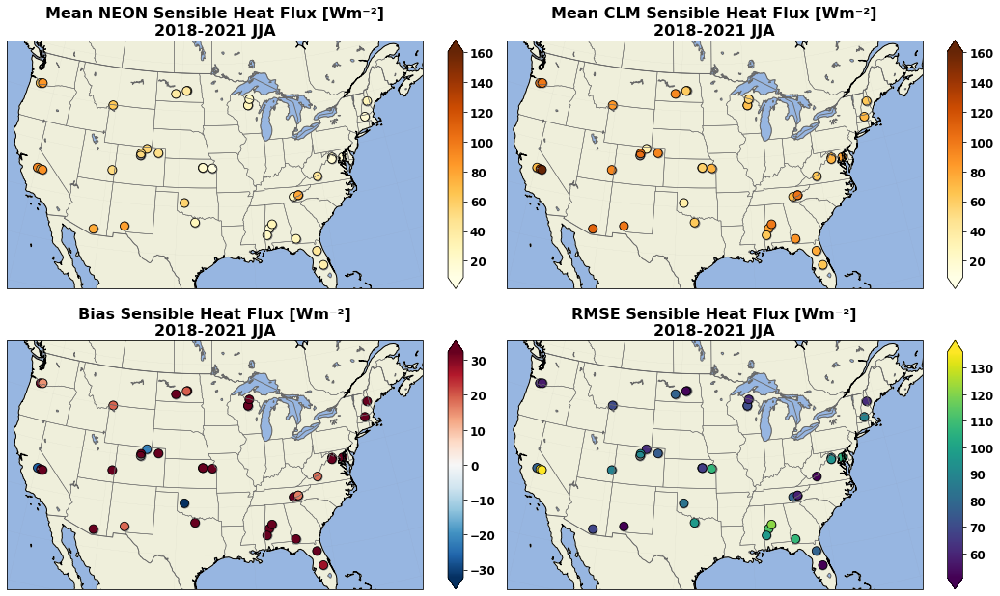

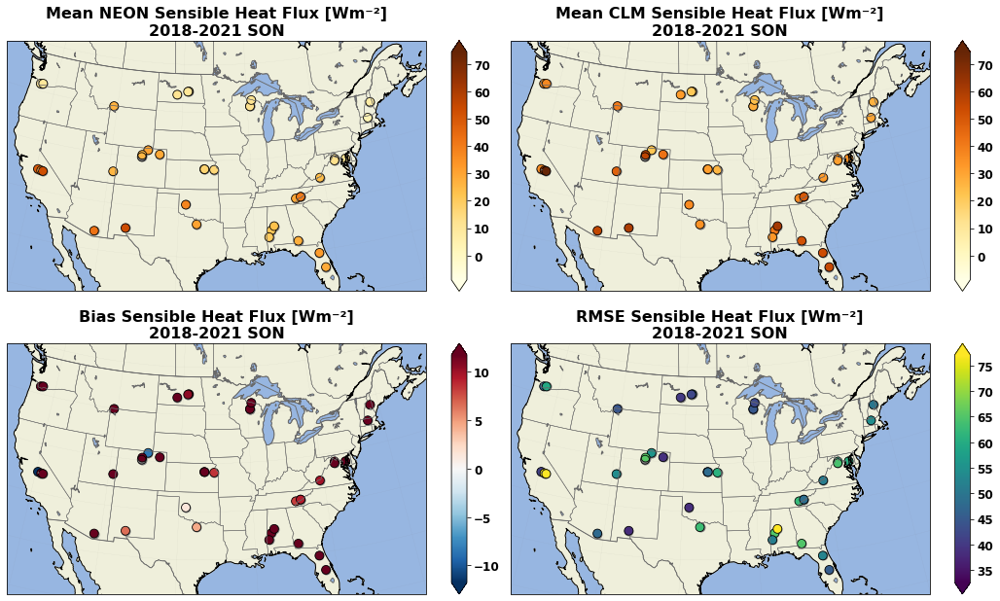

EFLX_LH_TOT


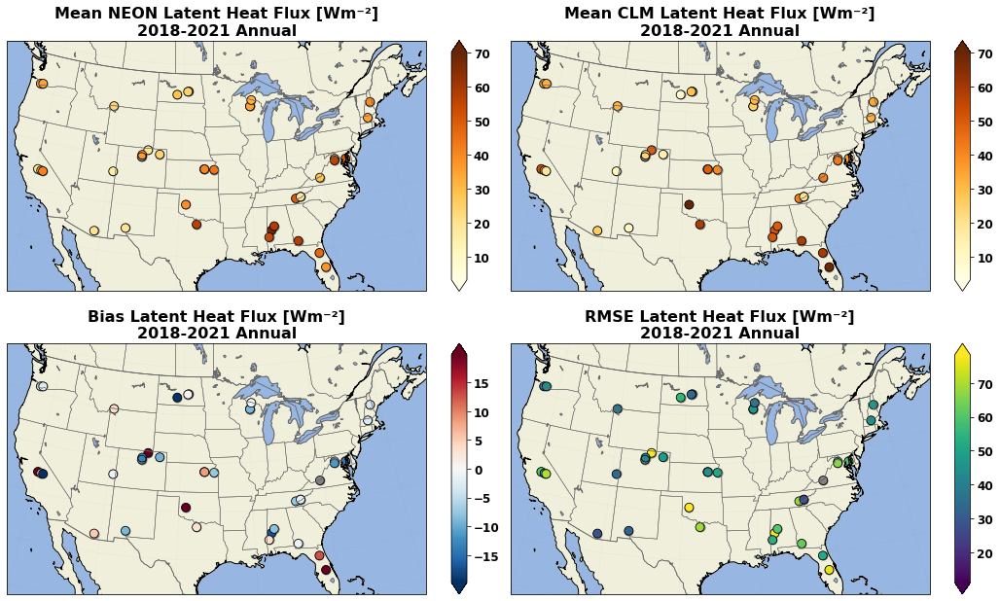

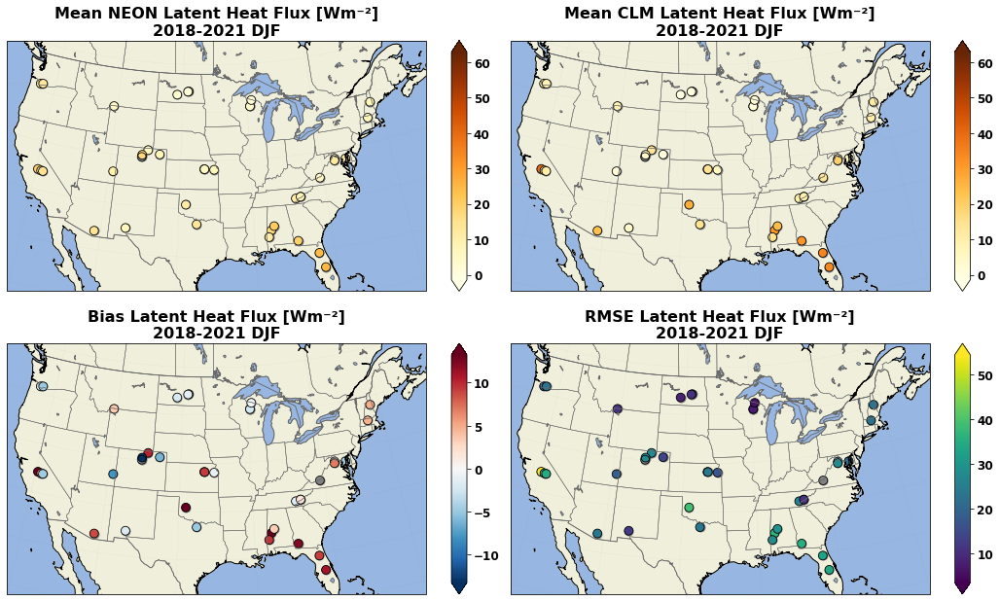

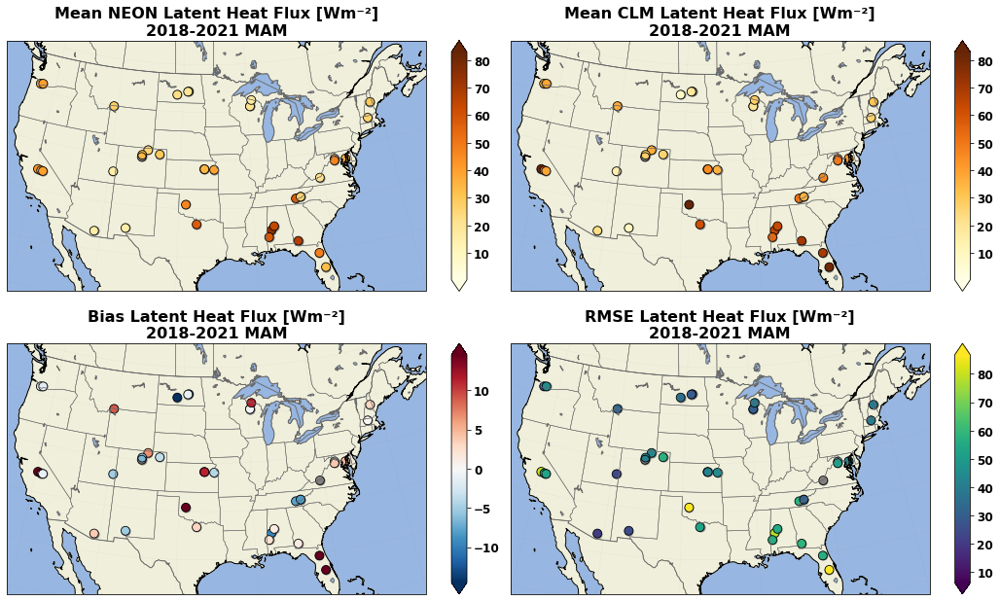

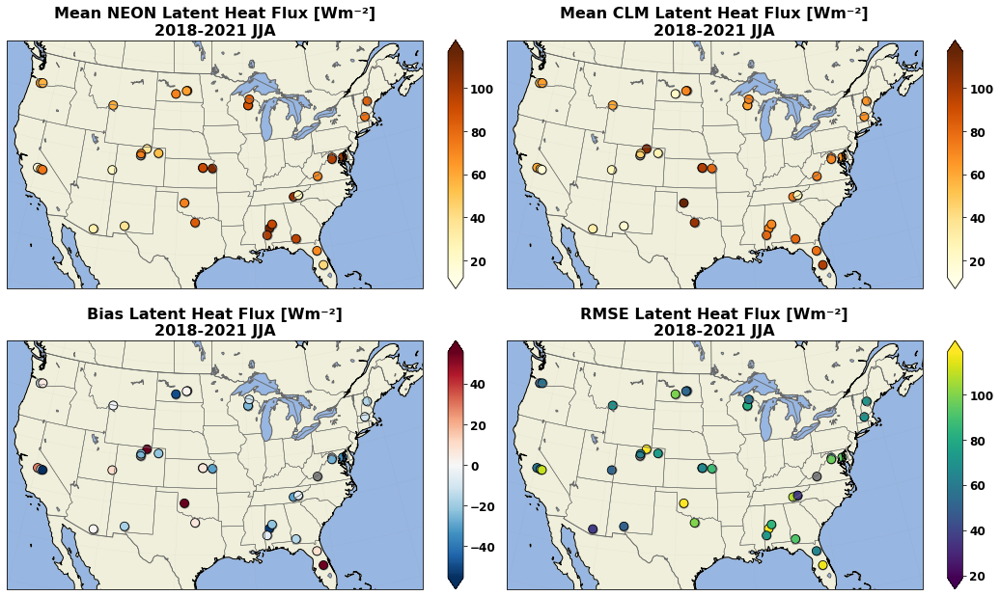

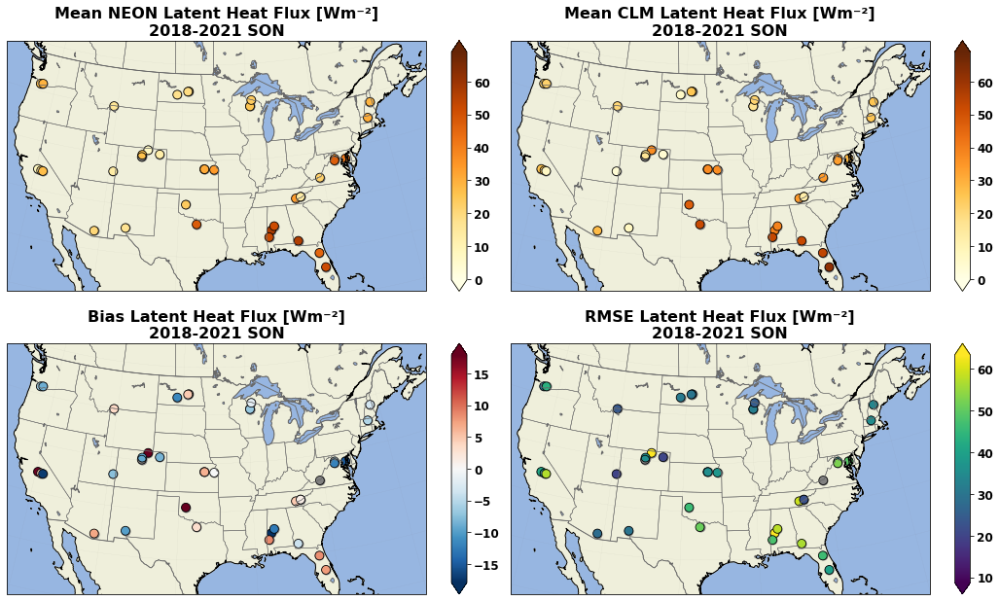

GPP


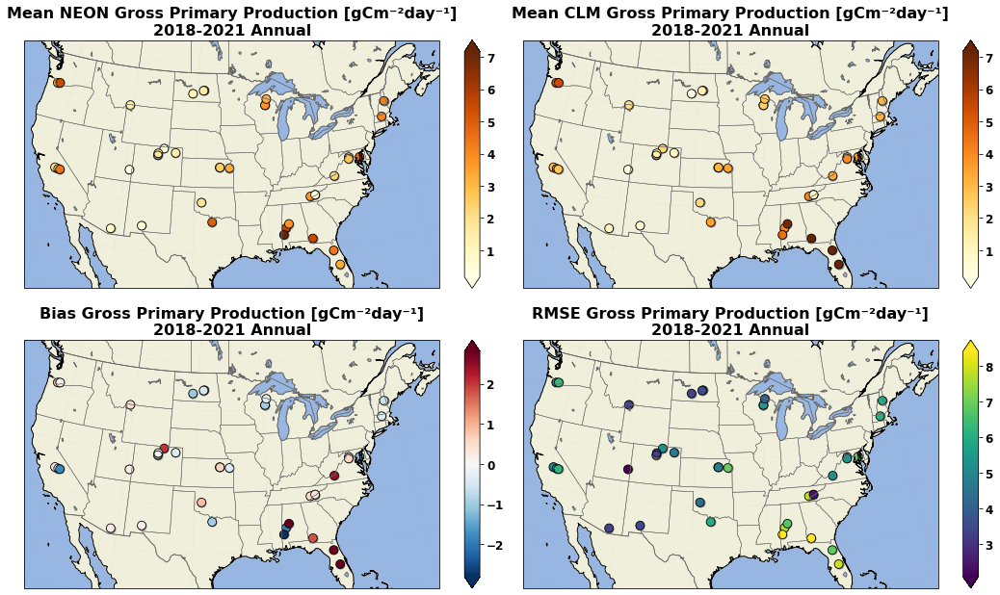

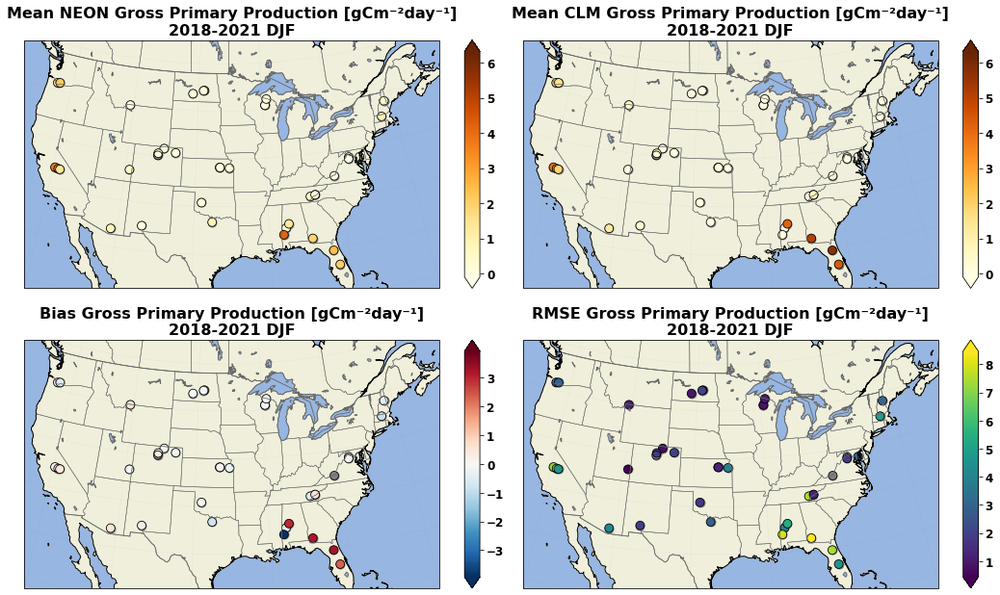

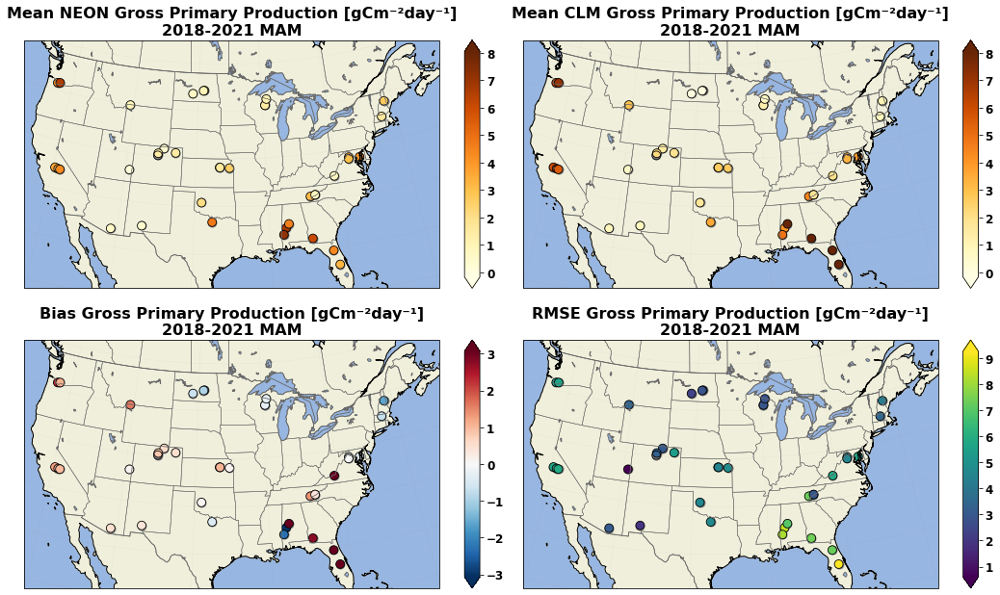

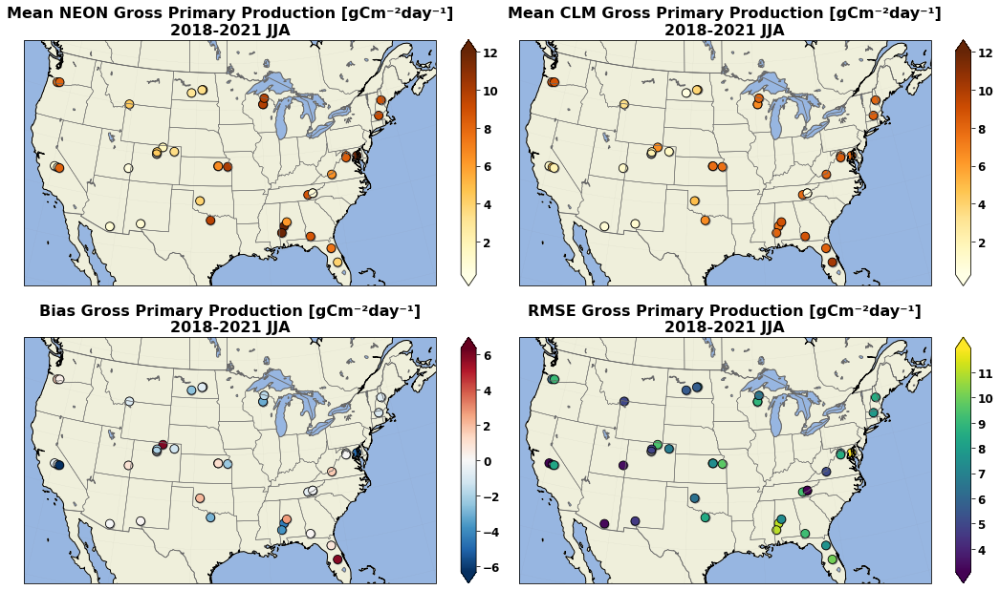

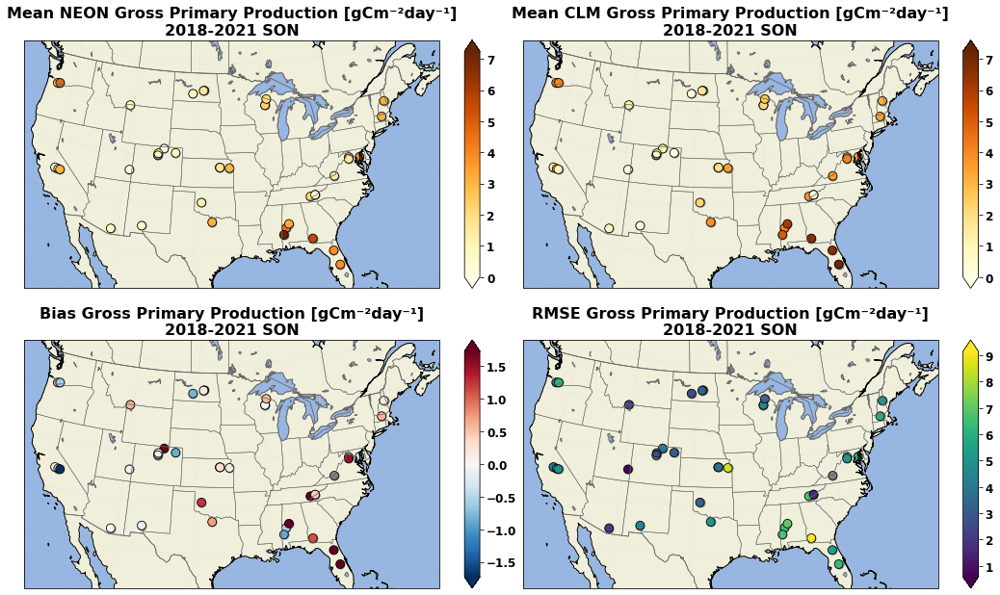

NEE


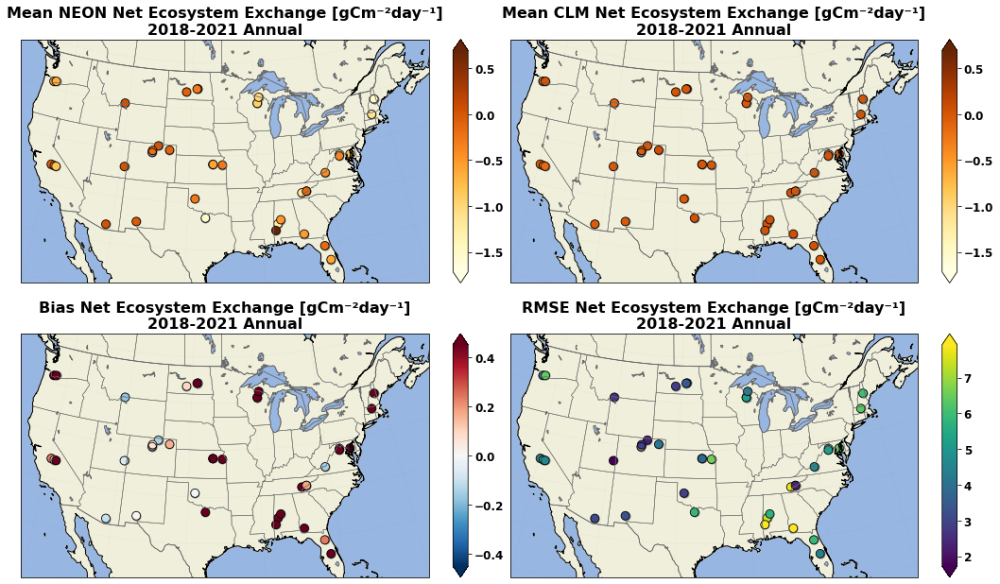

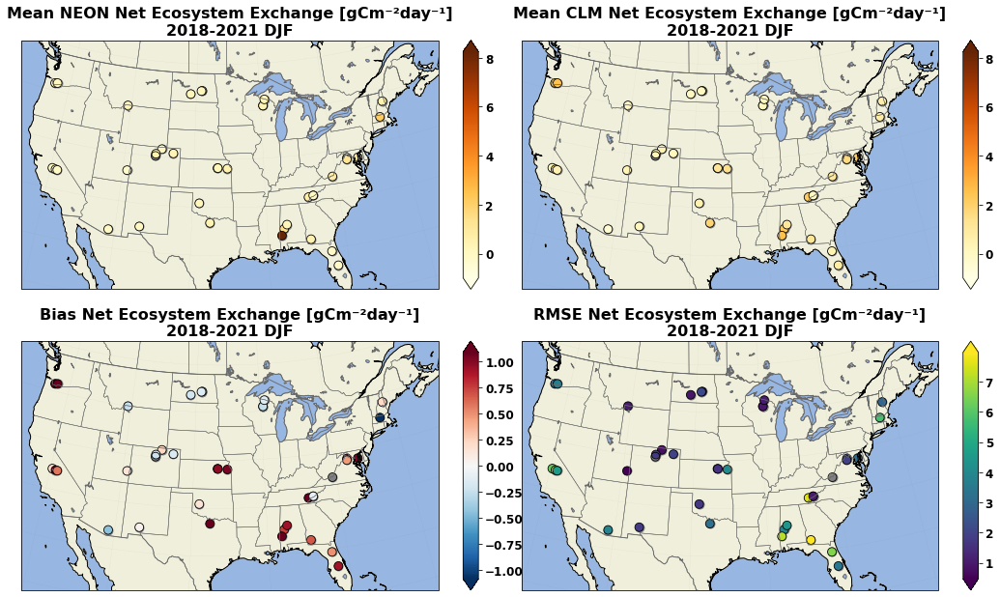

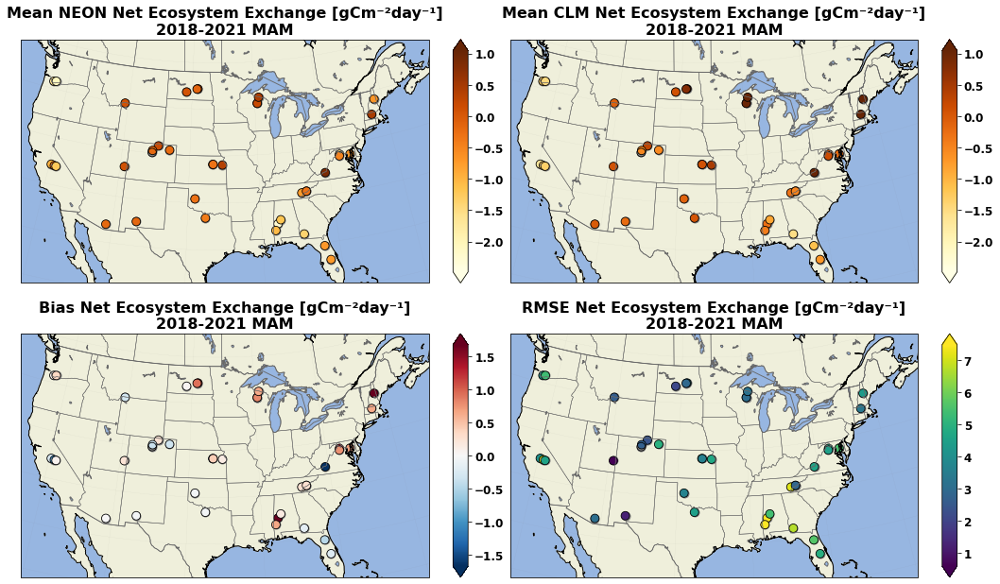

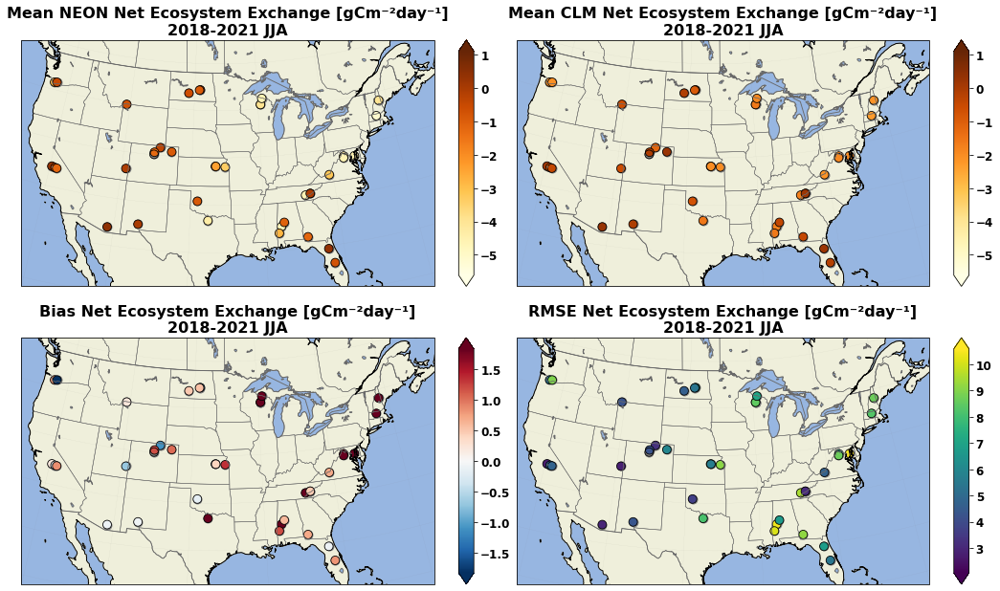

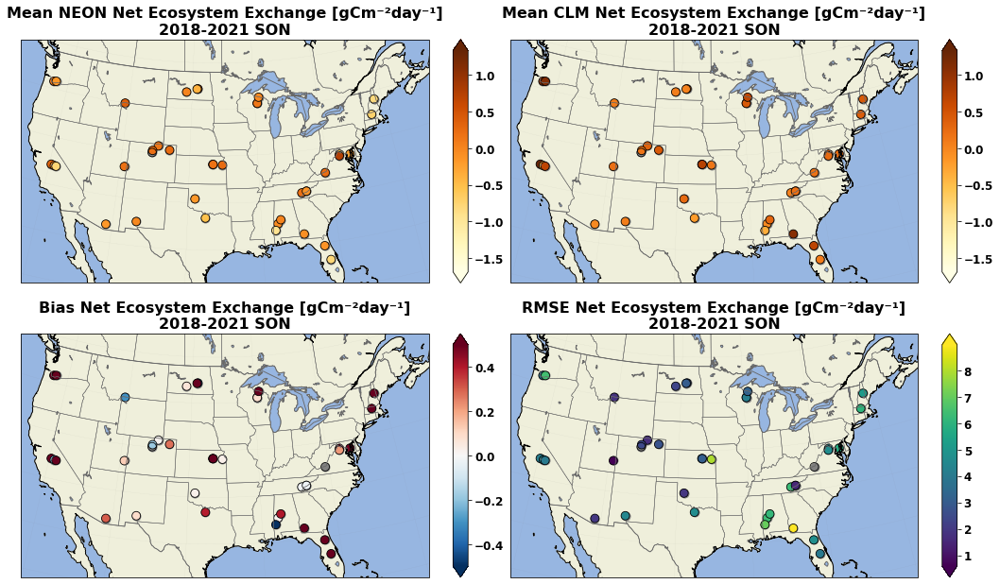

Rnet


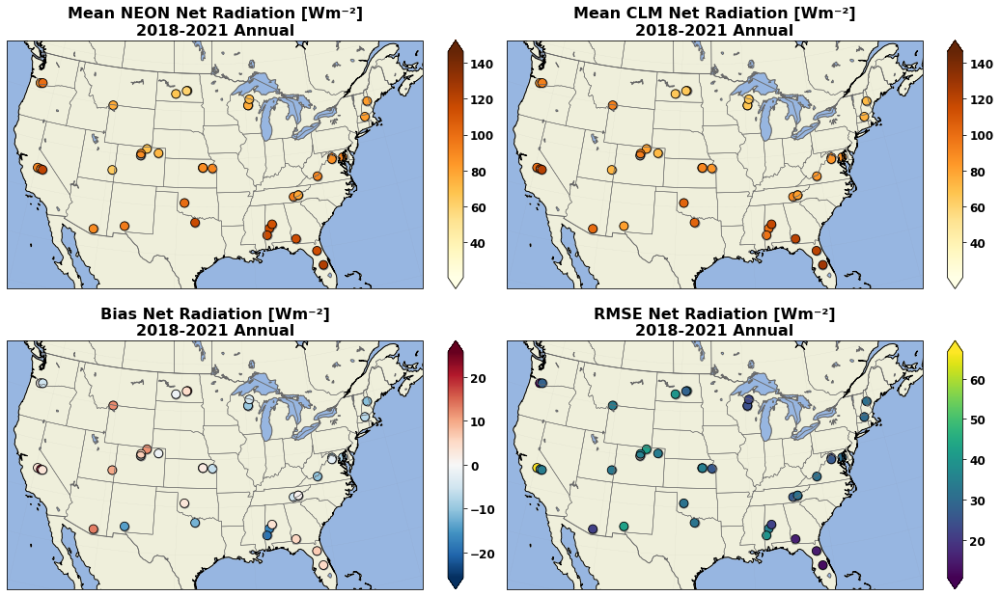

In [ ]:
projection=ccrs.AlbersEqualArea(central_lon, central_lat)

seasons = ['Annual','DJF', 'MAM', 'JJA', 'SON']
save_flag = False

for var in all_vars:
    plot_var = var.obs_var
    sim_var = var.sim_var
    plot_var_desc = var.long_name
    plot_var_unit = var.unit        #var = 'FSH'
    print (plot_var)
    for season in seasons:

        df_tmp = get_bias_data(df_all, plot_var, season)

        min_val = min (min(df_tmp['mean_neon_'+plot_var]), min(df_tmp['mean_clm_'+plot_var]))
        max_val = max (max(df_tmp['mean_neon_'+plot_var]), max(df_tmp['mean_clm_'+plot_var]))
    
        vmin = min_val + 0.1*min_val
        vmax = max_val - 0.1*max_val
        cmap = "YlOrBr"
        
        fig = plt.figure(figsize=(17,10.5), facecolor='w', edgecolor='k')
        ax = fig.add_subplot(2,2,1, projection=projection)
        
        title = "Mean NEON " + plot_var +' '+ season
        title = "Mean NEON "+ plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season

        this_var = 'mean_neon_'+plot_var
        plot_site_maps(df_tmp, this_var, title, ax, vmin, vmax, cmap)
        

        ax = fig.add_subplot(2,2,2, projection=projection)
        title = "Mean CLM " + plot_var +' '+ season
        title = "Mean CLM "+ plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season

        this_var = 'mean_clm_'+plot_var
        plot_site_maps(df_tmp, this_var, title, ax, vmin, vmax, cmap)

        # -- BIAS
        ax = fig.add_subplot(2,2,3, projection=projection)
        this_var = 'bias_'+plot_var

        min_val = min(df_tmp[this_var])
        max_val = max(df_tmp[this_var])
        
        vmin =min_val
        vmax = -min_val
        cmap = matplotlib.cm.get_cmap('RdBu_r')

        title = "Bias "+ plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season

        plot_site_maps(df_tmp, this_var, title, ax, vmin, vmax, cmap)

        
        # -- RMSE
        ax = fig.add_subplot(2,2,4, projection=projection)
        this_var = 'rmse_'+plot_var
        
        min_val = min(df_tmp[this_var])
        max_val = max(df_tmp[this_var])
        vmin = min_val + 0.1*min_val
        vmax = max_val - 0.1*max_val
        
        title = "RMSE "+ plot_var_desc+" ["+plot_var_unit+"]"+"\n"+"2018-2021"+ " " + season

        plot_site_maps(df_tmp, this_var, title, ax, vmin, vmax)
        
        plt.subplots_adjust(wspace=0.2,hspace=0.2)
        

        if save_flag:
            plot_name = 'spatial_stats_'+plot_var+'_'+season+'.png'
            plot_dir = os.path.join(out_dir,'spatial_plots_map_by_var', 'png')
            if not os.path.isdir(plot_dir):
                os.makedirs(plot_dir, exist_ok=True)   
            
            print ('Saving '+ os.path.join(plot_dir,plot_name))
            plt.savefig (os.path.join(plot_dir,plot_name), dpi=600,bbox_inches='tight')     
        else:
            plt.show()